In [ ]:
!pip install opencv-contrib-python==4.4.0.44
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import cv2
import random, math
from google.colab.patches import cv2_imshow

In [2]:
def open_image(image_name, image_path):
  #print(image_name, image_path)
  image = cv2.imread(image_path + image_name)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

# Question1

##keypoints and features

In [3]:
def get_keypoints_and_descriptors(image):
  sift = cv2.ORB_create()
  keypoints, descriptors = sift.detectAndCompute(image, None)
  
  return keypoints, descriptors

In [4]:
def get_best_matches(image1, image2, ratio = .4):
  keypoints1, descriptor1 = get_keypoints_and_descriptors(image1)
  keypoints2, descriptor2 = get_keypoints_and_descriptors(image2)
  
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(descriptor1, descriptor2, 2)

  good_points_1 = []
  good_points_2 = []

  good_match_objects = []
  for m,n in matches:
        if m.distance < ratio * n.distance:
            good_points_1.append(keypoints1[m.queryIdx].pt)
            good_points_2.append(keypoints2[m.trainIdx].pt)
    
  good_points_1 = np.asarray(good_points_1, dtype = np.float32)
  good_points_2 = np.asarray(good_points_2, dtype = np.float32)
  
  return good_points_1, good_points_2

##Homography

In [5]:
def get_homography_matrix(image_points1, image_points2):
    number_of_points = image_points1.shape[0]
    A = []
    for i in range(number_of_points):
        x, y = image_points1[i, 0], image_points1[i, 1]
        u, v = image_points2[i, 0], image_points2[i, 1]
        A.append( [x, y, 1, 0, 0, 0, -u * x, -u * y, -u] )
        A.append( [0, 0, 0, x, y, 1, -v * x, -v * y, -v] )

    # Convert A to array
    A = np.asarray(A) 

    # Find the 11 parameters:
    U, S, V = np.linalg.svd(A)

    # The parameters are in the last line of Vh and normalize them
    P = V[-1, :] / V[-1, -1]
    
    # Camera projection matrix
    P = P.reshape(3, 3).astype('float32')

    return P

##Ransac

In [6]:
def ransac(image_points1, image_points2, iterations = 1000, best_error = math.inf):
    
    image_points1 = np.asarray(image_points1).astype('float32')
    image_points2 = np.asarray(image_points2).astype('float32')
    
    number_of_points_for_homography = 6

    P_actual = np.zeros((3,3), dtype = 'float32')
    for i in range(iterations):
        indices = np.random.permutation(image_points1.shape[0])
        indices = list(indices)[:number_of_points_for_homography]
        img_points_chosen1, img_points_chosen2 = np.take(image_points1, indices, axis = 0), np.take(image_points2, indices, axis = 0)

        P = get_homography_matrix(img_points_chosen1, img_points_chosen2)
        
        #Homogenised image coordinates
        homogenised_im = np.concatenate( (image_points1.T, np.ones((1, image_points1.shape[0]))), axis = 0)
    
        projected_points = np.dot(P, homogenised_im) 
        projected_points = projected_points / projected_points[2, :] 
        projected_points = projected_points.T
        
        total_error = 0
        for i in range(image_points2.shape[0]):
            error = np.linalg.norm(projected_points[i][0:2] - image_points2[i])
            total_error += error
        
        mse = total_error/image_points2.shape[0]

        if(mse < best_error):
            best_error = mse
            P_actual = P

    P_actual = np.array(P_actual)
    return P_actual, error

##Stitching

###Functions

In [7]:
def remove_dark_areas(image):
    column_number = 0
    for row in range(image.shape[0]):
      for column in range(image.shape[1]):
        if image[row][column][0] == 0 and image[row][column][1] == 0 and image[row][column][2] == 0:
          break
        elif(column+1 > column_number):
          column_number = column+1
          #print(column+1)
          
    
    row_number = 0
    for column in range(image.shape[1]):
      for row in range(image.shape[0]):
        if image[row][column][0] == 0 and image[row][column][1] == 0 and image[row][column][2] == 0:
          break
        elif(row+1 > row_number):
          row_number = row + 1
    
    image = image[0:row_number, 0 :column_number, :]
    return image

In [8]:
def stitch_images(image1, image2, H, condition = "side_by_side"):
    if(condition == "side_by_side"):
      panorama_size = (2*max(image1.shape[1], image2.shape[1]), max(image1.shape[0], image2.shape[0]))
    else:
      #print("up_and_down")
      panorama_size = (2*max(image1.shape[1], image2.shape[1]), 2*max(image1.shape[0], image2.shape[0]))
    
    #print("panorma size {}".format(panorama_size))
    panorama_image = cv2.warpPerspective(image2, H, panorama_size)
    #print("Panorama image shape is {}".format(panorama_image.shape))
    #print("Image1 shape is {}".format(image1.shape))
    panorama_image[0:image1.shape[0], 0:image1.shape[1], :] = image1
    #print("Final shape is {}".format(panorama_image.shape))
    panorama_image = remove_dark_areas(panorama_image)
  
    
    return panorama_image

###Image1

In [9]:
# Image 1 examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('img1_1.jpg', path)
img2 = open_image('img1_2.jpg', path)
img3 = open_image('img1_3.jpg', path)
img4 = open_image('img1_4.jpg', path)

pts1, pts2 = get_best_matches(img3, img4, .6)
M_hom, _ = ransac(pts2, pts1)
img = stitch_images(img3, img4, M_hom)

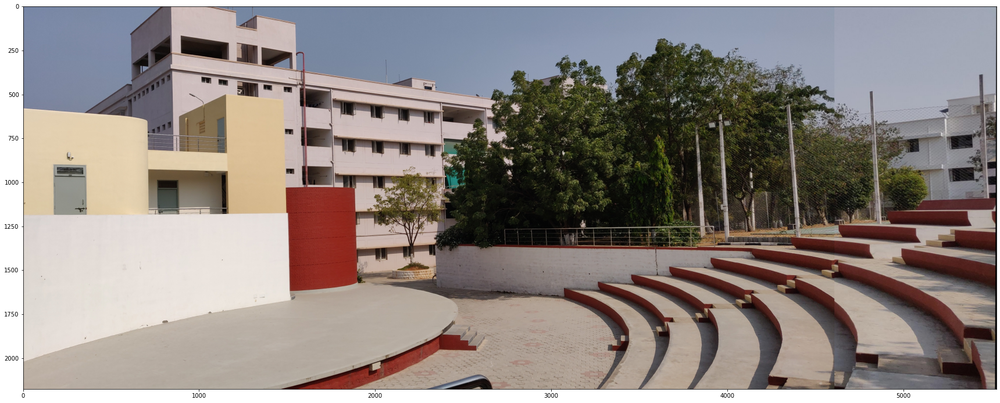

In [10]:
plt.figure(figsize = (30,30))
plt.imshow(img)

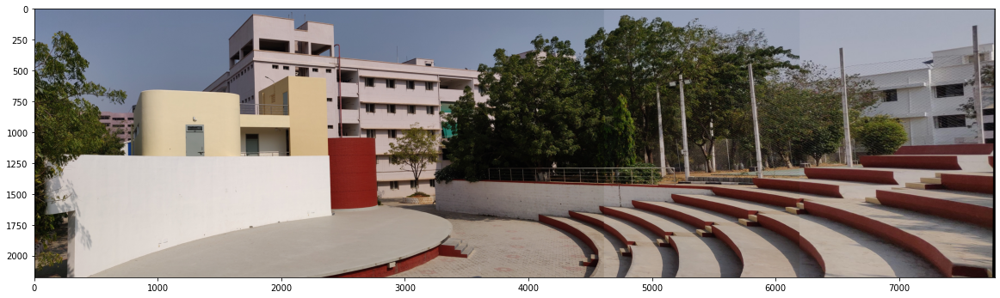

In [11]:
pts1_2, pts2_2 = get_best_matches(img2, img, 0.6)
M_hom_2, _ = ransac(pts2_2, pts1_2)
img_2 = stitch_images(img2, img, M_hom_2)
plt.figure(figsize = (20,20))
plt.imshow(img_2)

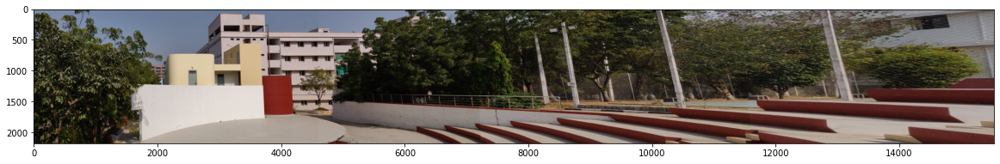

In [12]:
pts1_3, pts2_3 = get_best_matches(img1, img_2, 0.68)
M_hom_3, _ = ransac(pts2_3, pts1_3)
img_3 = stitch_images(img1, img_2, M_hom_3)
plt.figure(figsize = (20,20))
plt.imshow(img_3)

###Image2

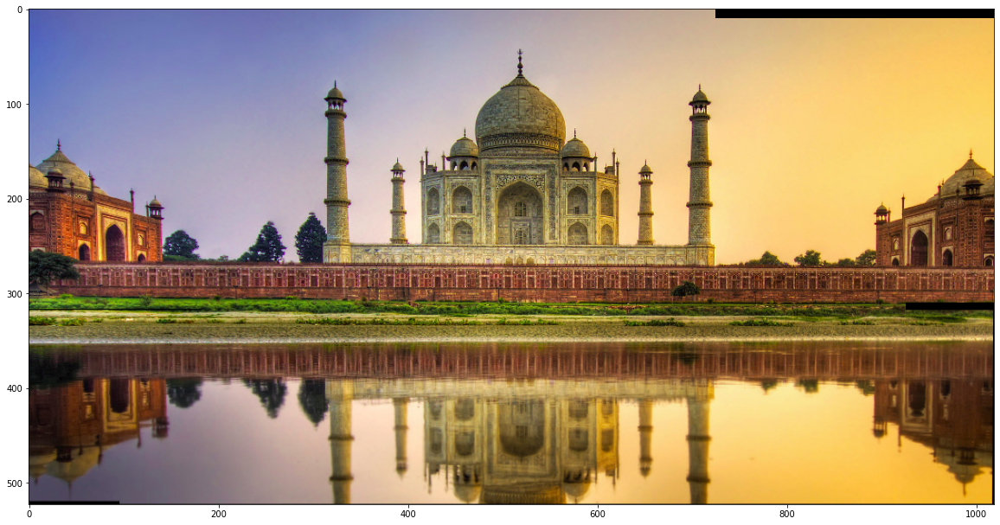

In [13]:
# Image 2 examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('img2_1.png', path)
img2 = open_image('img2_2.png', path)
img3 = open_image('img2_3.png', path)
img4 = open_image('img2_4.png', path)
img5 = open_image('img2_5.png', path)
img6 = open_image('img2_6.png', path)

pts1, pts2 = get_best_matches(img2, img3)
M_hom, _ = ransac(pts2, pts1)
img = stitch_images(img2, img3, M_hom)

pts1, pts2 = get_best_matches(img1, img)
M_hom, _ = ransac(pts2, pts1)
img_top = stitch_images(img1, img, M_hom)

pts1, pts2 = get_best_matches(img5, img6)
M_hom, _ = ransac(pts2, pts1)
img_bottom = stitch_images(img5, img6, M_hom)

pts1, pts2 = get_best_matches(img4, img_bottom)
M_hom,_ = ransac(pts2, pts1)
img_bottom = stitch_images(img4, img_bottom, M_hom)

pts1, pts2 = get_best_matches(img_top, img_bottom, .7)
M_hom,_ = ransac(pts2, pts1)
img = stitch_images(img_top, img_bottom, M_hom, "up_and_down")

plt.figure(figsize = (20,20))
plt.imshow(img)

###Image3

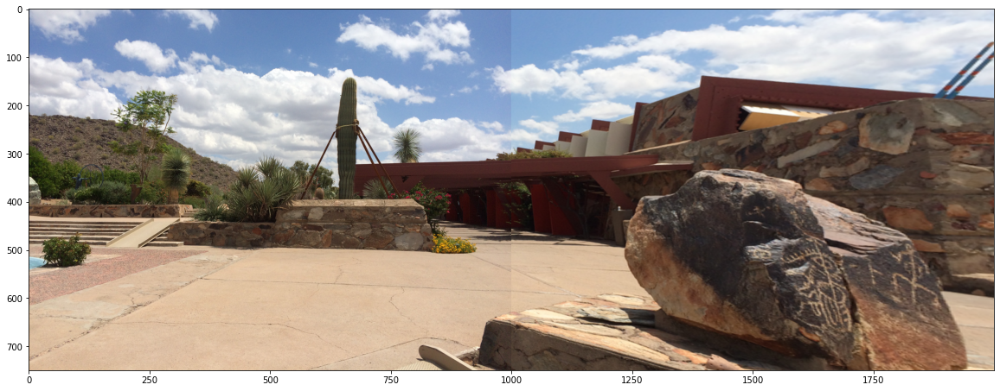

In [14]:
# Image 3 examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('img3_1.png', path)
img2 = open_image('img3_2.png', path)

pts1, pts2 = get_best_matches(img1, img2, 0.68)
M_hom,_ = ransac(pts2, pts1)
img = stitch_images(img1, img2, M_hom)

plt.figure(figsize = (20,20))
plt.imshow(img)

###Image4

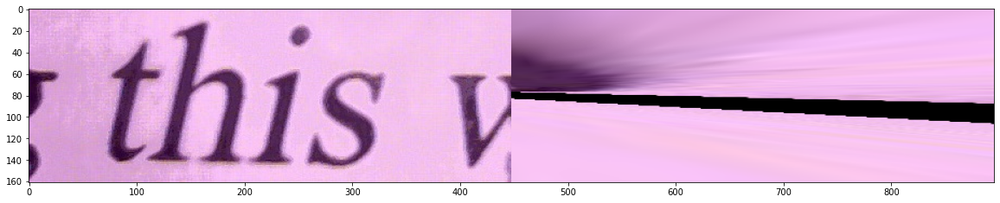

In [15]:
# Image 4 examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('img4_1.jpg', path)
img2 = open_image('img4_2.jpg', path)

pts1, pts2 = get_best_matches(img1, img2, 0.77)
M_hom,_ = ransac(pts2, pts1)
img = stitch_images(img1, img2, M_hom)

plt.figure(figsize = (20,20))
plt.imshow(img)

###Image5

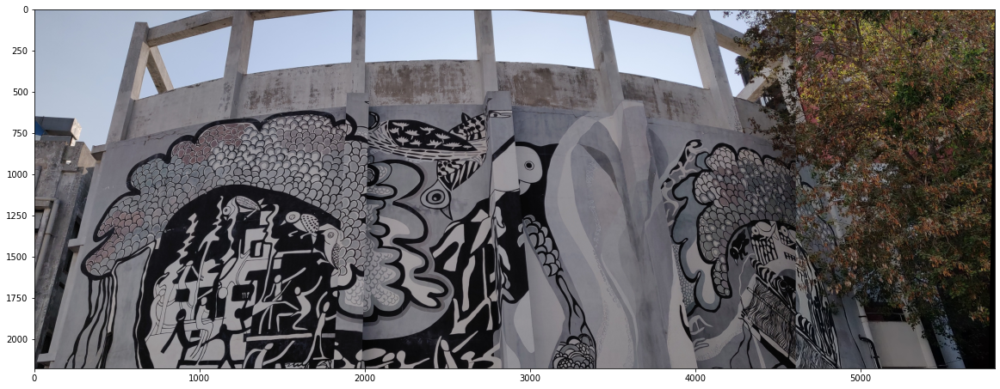

In [16]:
# Image 5 examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('img5_1.jpg', path)
img2 = open_image('img5_2.jpg', path)
img3 = open_image('img5_3.jpg', path)
img4 = open_image('img5_4.jpg', path)

pts1, pts2 = get_best_matches(img1, img2, 0.72)
M_hom,_ = ransac(pts2, pts1)
img_top = stitch_images(img1, img2, M_hom)

plt.figure(figsize = (20,20))
plt.imshow(img_top)

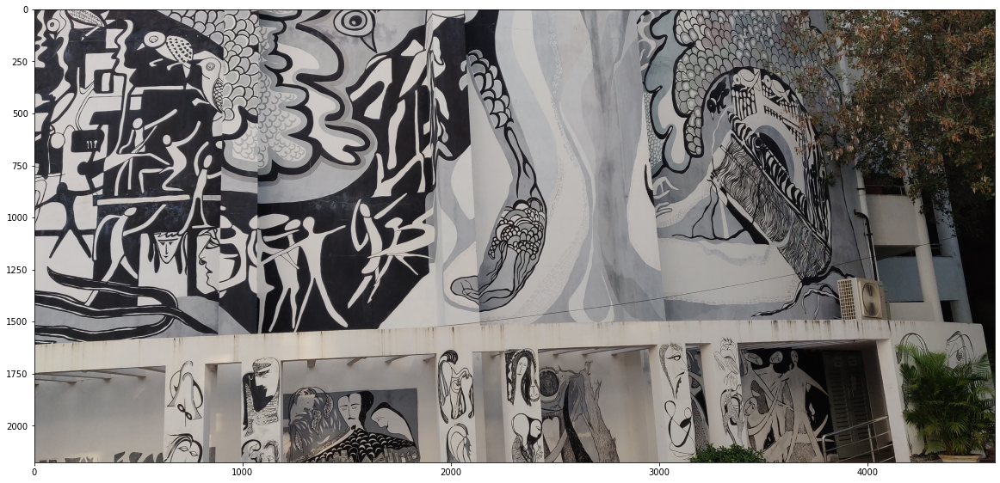

In [17]:
pts1, pts2 = get_best_matches(img3, img4, 0.72)
M_hom,_ = ransac(pts2, pts1)
img_bottom = stitch_images(img3, img4, M_hom)

plt.figure(figsize = (20,20))
plt.imshow(img_bottom)

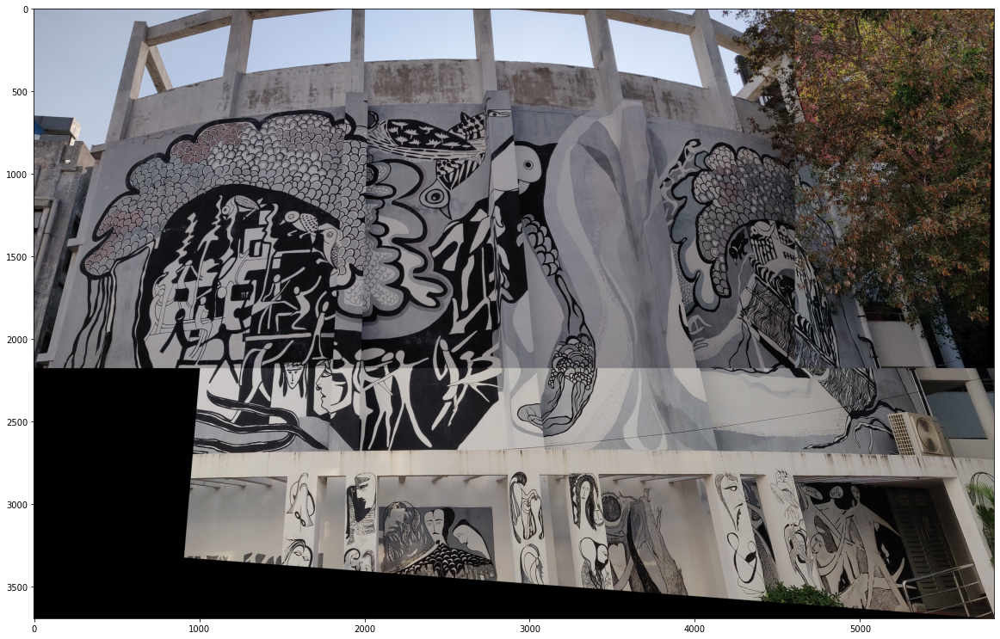

In [18]:
pts1, pts2 = get_best_matches(img_top, img_bottom, 0.58)
M_hom,_ = ransac(pts2, pts1)
img = stitch_images(img_top, img_bottom, M_hom, "up_and_down")

plt.figure(figsize = (20,20))
plt.imshow(img)

###My_Image

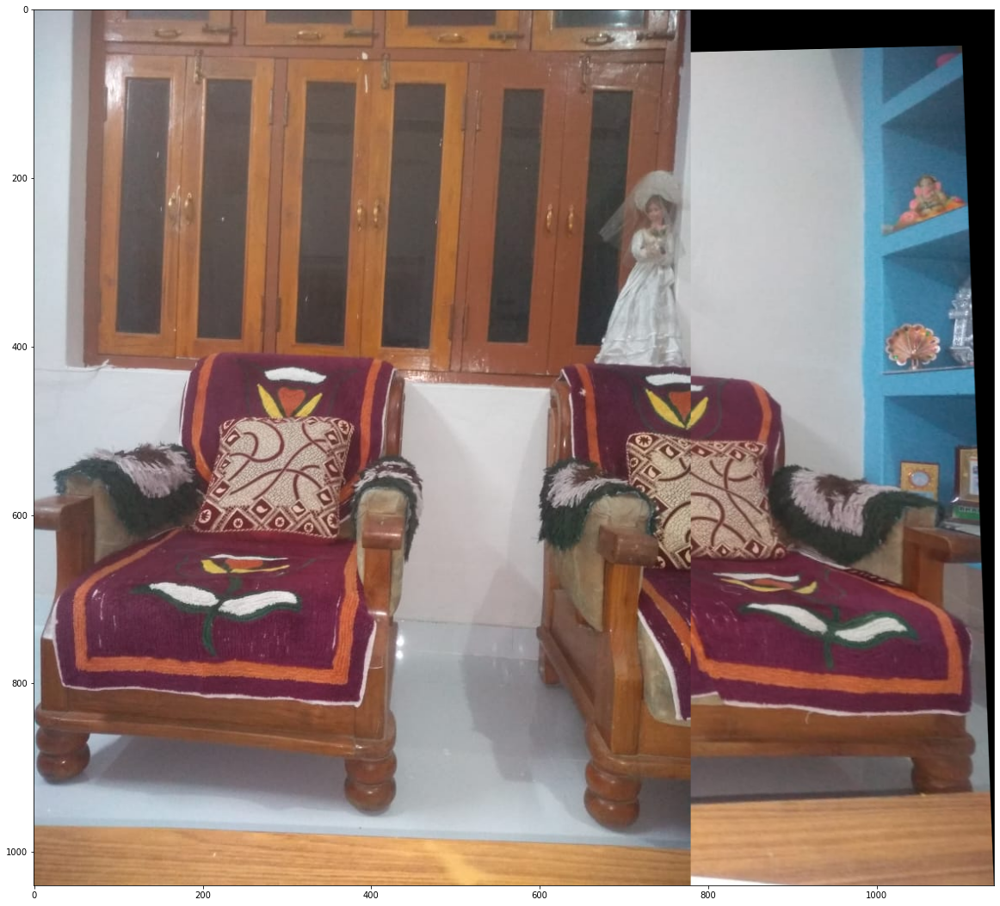

In [24]:
# My Image examples
#path = "/content/drive/MyDrive/Colab Notebooks/Data/image_mosaicing/"
path = "../images/image_mosaicing/"

img1 = open_image('my_img1.jpg', path)
img2 = open_image('my_img2.jpg', path)

pts1, pts2 = get_best_matches(img1, img2, 0.68)
M_hom,_ = ransac(pts2, pts1)
img = stitch_images(img1, img2, M_hom)

plt.figure(figsize = (20,20))
plt.imshow(img)

#Question 2

##Intensity Matching

In [20]:
def correlation(v1, v2):
  return v1.T.dot(v2)/(np.sqrt(v1.T.dot(v1))*np.sqrt(v2.T.dot(v2)))

def patch_matching(image1, image2, window_size = 40):
  best_matching_pts = []
  stride = window_size
  
  for y1 in range(0, image1.shape[0] - window_size, stride):
    for x1 in range(0, image1.shape[1] - window_size, stride):
      feature_patch1 = image1[y1:y1 + window_size, x1:x1 + window_size, :].flatten()
      feature_patch1 = feature_patch1 - feature_patch1.mean()
      best_distance = -math.inf
      
      for x2 in range(0, image2.shape[1] - window_size, stride):
        for y2 in range(0, image2.shape[0] - window_size, stride):
          feature_patch2 = image2[y2:y2 + window_size, x2:x2 + window_size,:].flatten()
          feature_patch2 = feature_patch2 - feature_patch2.mean()
          distance = correlation(feature_patch1, feature_patch2)
          
          if(distance > best_distance):
            best_distance = distance
            coordinates = [[x1 + window_size//2, y1 + window_size //2],[x2 + window_size//2, y2 + window_size // 2], best_distance]

      if(best_distance > -math.inf and best_distance < math.inf):
        best_matching_pts.append(coordinates)
    
  return best_matching_pts, window_size


def draw_matching_pts(image1, image2, matches, window_size):
  fig = plt.figure(figsize=(20,20))
  ax1 = fig.add_subplot(121)
  ax2 = fig.add_subplot(122)
  ax1.imshow(image1)
  ax2.imshow(image2)
  
  for match in matches:
    pt1 = (match[0][0], match[0][1])
    pt2 = (match[1][0], match[1][1])

    #print(pt1, pt2)
    con = ConnectionPatch(xyA = pt1, xyB = pt2, coordsA = "data", coordsB = "data", axesA = ax1, axesB = ax2, color = "red")
    #ax1.add_artist(con)
    ax2.add_artist(con)
    ax1.plot(pt1[0], pt1[1], 'ro', markersize = 3)
    ax2.plot(pt2[0], pt2[1], 'ro', markersize = 3)
  
  plt.show()

###Image1

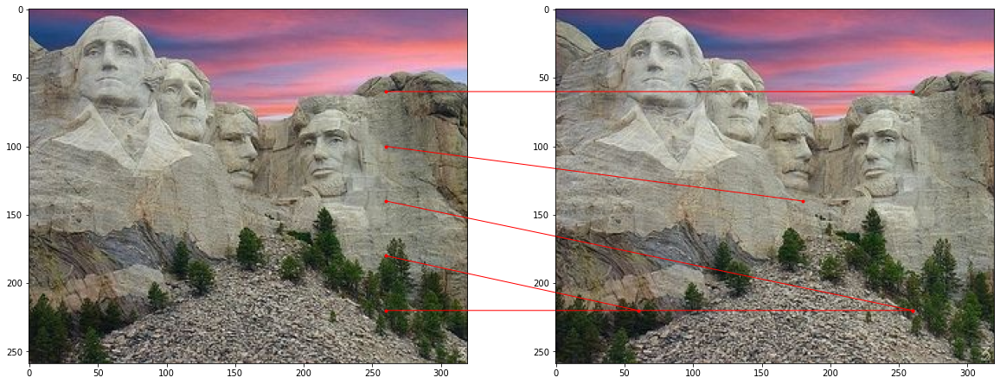

In [25]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('1_1.jpg', path)
img2 = open_image('1_2.jpg', path)

matches, window_size = patch_matching(img1, img2)
matches.sort(key = lambda x: (x[0], x[2]), reverse = True)
selected_matches = matches[0:5]
draw_matching_pts(img1, img2, selected_matches, window_size)

###Image2

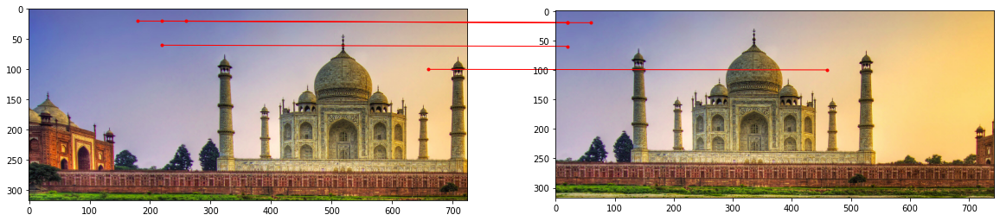

In [26]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('2_1.png', path)
img2 = open_image('2_2.png', path)

matches, window_size = patch_matching(img1, img2)
matches.sort(key = lambda x: (x[2]), reverse = True)
selected_matches = matches[:5]
draw_matching_pts(img1, img2, selected_matches, window_size)

###Image3

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


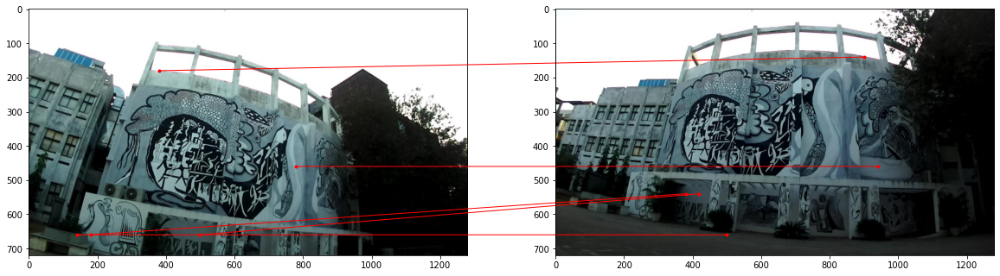

In [27]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('3_1.jpg', path)
img2 = open_image('3_2.jpg', path)

matches, window_size = patch_matching(img1, img2)
matches.sort(key = lambda x: (x[2]), reverse = True)
selected_matches = matches[5:10]
draw_matching_pts(img1, img2, selected_matches, window_size)

##Epipolar Lines

In [30]:
def execute(img1, img2):
  # Initiate SIFT detector
  sift = cv2.SIFT_create()
  
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1, None)
  kp2, des2 = sift.detectAndCompute(img2, None)

  # Match keypoints in both images
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)   # or pass empty dictionary
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k=2)

  # Keep good matches: calculate distinctive image features
  matchesMask = [[0, 0] for i in range(len(matches))]
  good = []
  pts1 = []
  pts2 = []

  for i, (m, n) in enumerate(matches):
      if m.distance < 0.7*n.distance:
          # Keep this keypoint pair
          matchesMask[i] = [1, 0]
          good.append(m)
          pts2.append(kp2[m.trainIdx].pt)
          pts1.append(kp1[m.queryIdx].pt)

  # STEREO RECTIFICATION

  # Calculate the fundamental matrix for the cameras
  pts1 = np.int32(pts1)
  pts2 = np.int32(pts2)
  fundamental_matrix, inliers = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

  # We select only inlier points
  pts1 = pts1[inliers.ravel() == 1]
  pts2 = pts2[inliers.ravel() == 1]


  # Stereo rectification (uncalibrated variant)
  h1, w1 = img1.shape[0],img1.shape[1]
  h2, w2 = img2.shape[0], img2.shape[1]
  P, H1, H2 = cv2.stereoRectifyUncalibrated( np.float32(pts1), np.float32(pts2), fundamental_matrix, imgSize=(w1, h1))

  #print(P, H1, H2)
  #print(h1, w1, h2, w2)

  # rectify the images
  img1_rectified = cv2.warpPerspective(img1, H1, (w1, h1))
  img2_rectified = cv2.warpPerspective(img2, H2, (w2, h2))

  return img1_rectified, img2_rectified, fundamental_matrix, pts1, pts2

In [31]:
# Visualize epilines
def drawlines(img1src, img2src, lines, pts1src, pts2src):
    r, c, _ = img1src.shape
    #img1color = cv2.cvtColor(img1src, cv2.COLOR_GRAY2BGR)
    #img2color = cv2.cvtColor(img2src, cv2.COLOR_GRAY2BGR)
    img1color = img1src
    img2color = img2src
    # Edit: use the same random seed so that two images are comparable!
    np.random.seed(0)
    for r, pt1, pt2 in zip(lines, pts1src, pts2src):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        img1color = cv2.line(img1color, (x0, y0), (x1, y1), color, 1)
        img1color = cv2.circle(img1color, tuple(pt1), 2, color, -1)
        img2color = cv2.circle(img2color, tuple(pt2), 2, color, -1)
    return img1color, img2color

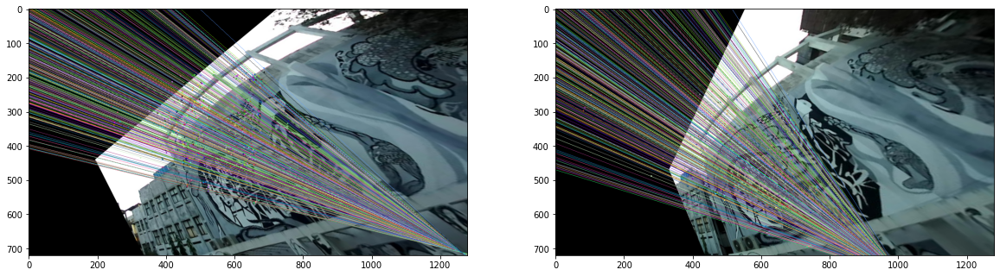

In [37]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('3_2.jpg', path)
img2 = open_image('3_1.jpg', path)
rimg1, rimg2, F, pts1, pts2 = execute(img1, img2)

# Find epilines corresponding to points in right image (second image) and drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1, 1, 2), 2, F)
lines1 = lines1.reshape(-1, 3)
img5, img6 = drawlines(rimg1, rimg2, lines1, pts1, pts2)

# Find epilines corresponding to points in left image (first image) and drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 1, F)
lines2 = lines2.reshape(-1, 3)
img3, img4 = drawlines(rimg2, rimg1, lines2, pts2, pts1)

plt.figure(figsize = (20,20))
plt.subplot(121), plt.imshow(img5)
plt.subplot(122), plt.imshow(img3)
plt.show()

##Rectify the images

In [33]:
def execute(img1, img2):
  # Initiate SIFT detector
  sift = cv2.SIFT_create()
  
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1, None)
  kp2, des2 = sift.detectAndCompute(img2, None)

  # Match keypoints in both images
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)   # or pass empty dictionary
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k=2)

  # Keep good matches: calculate distinctive image features
  matchesMask = [[0, 0] for i in range(len(matches))]
  good = []
  pts1 = []
  pts2 = []

  for i, (m, n) in enumerate(matches):
      if m.distance < 0.7*n.distance:
          # Keep this keypoint pair
          matchesMask[i] = [1, 0]
          good.append(m)
          pts2.append(kp2[m.trainIdx].pt)
          pts1.append(kp1[m.queryIdx].pt)

  # STEREO RECTIFICATION

  # Calculate the fundamental matrix for the cameras
  pts1 = np.int32(pts1)
  pts2 = np.int32(pts2)
  fundamental_matrix, inliers = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

  # We select only inlier points
  pts1 = pts1[inliers.ravel() == 1]
  pts2 = pts2[inliers.ravel() == 1]


  # Stereo rectification (uncalibrated variant)
  h1, w1 = img1.shape[0],img1.shape[1]
  h2, w2 = img2.shape[0], img2.shape[1]
  P, H1, H2 = cv2.stereoRectifyUncalibrated( np.float32(pts1), np.float32(pts2), fundamental_matrix, imgSize=(w1, h1))

  #print(P, H1, H2)
  #print(h1, w1, h2, w2)

  # rectify the images
  img1_rectified = cv2.warpPerspective(img1, H1, (w1, h1))
  img2_rectified = cv2.warpPerspective(img2, H2, (w2, h2))

  return img1_rectified, img2_rectified, fundamental_matrix, pts1, pts2

In [35]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('3_2.jpg', path)
img2 = open_image('3_1.jpg', path)

In [36]:
rimg1, rimg2, _, _, _ = execute(img1, img2)

## Brtue Force vs Greedy

In [38]:
def greedy_patch_matching(image1, image2, window_size = 40):
  best_matching_pts = []
  stride = 20
  
  for y1 in range(0, image1.shape[0] - window_size, stride):
    starting_point = 0
    for x1 in range(0, image1.shape[1] - window_size, stride):
      if(img1[y1][x1][0] == 0 and img1[y1][x1][1] == 0 and img1[y1][x1][2] == 0):
        continue
      if(starting_point >= img2.shape[1]):
        break
      feature_patch1 = image1[y1:y1 + window_size, x1:x1 + window_size, :].flatten()
      feature_patch1 = feature_patch1 - feature_patch1.mean()
      best_distance = -math.inf
      
      for x2 in range(starting_point, image2.shape[1] - window_size, stride):
        feature_patch2 = image2[y1:y1 + window_size, x2:x2 + window_size,:].flatten()
        feature_patch2 = feature_patch2 - feature_patch2.mean()
        distance = correlation(feature_patch1, feature_patch2)
        
        if(distance > best_distance and distance < math.inf):
          best_distance = distance
          starting_point = x2+1
          coordinates = [[x1 + window_size//2, y1 + window_size //2],[x2 + window_size//2, y1 + window_size // 2], best_distance]
          best_matching_pts.append(coordinates)
          

    
  return best_matching_pts, window_size

In [48]:
#path = "/content/drive/MyDrive/Colab Notebooks/Data/Stereo Correspondence/"
path = "../images/Stereo Correspondence/"

img1 = open_image('3_2.jpg', path)
img2 = open_image('3_1.jpg', path)

rimg1, rimg2, _ , _, _ = execute(img1, img2)

In [ ]:
#plt.imshow(rimg1)
#plt.imshow(rimg2)

###Greedy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


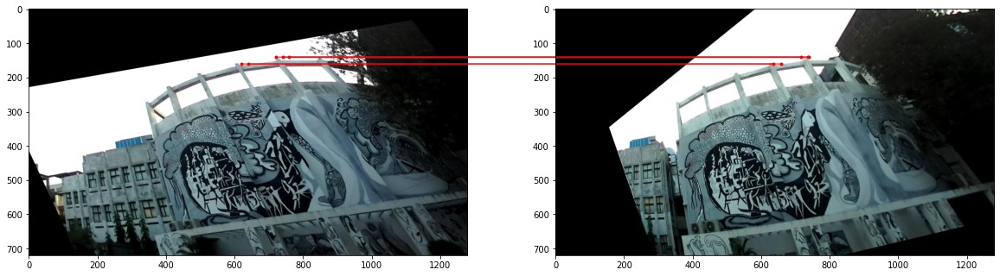

In [51]:
matches, window_size = greedy_patch_matching(rimg1, rimg2)
matches.sort(key = lambda x: (x[2]), reverse = True)
selected_matches = matches[10:15]
draw_matching_pts(rimg1, rimg2, selected_matches, window_size)

###Brute Force

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


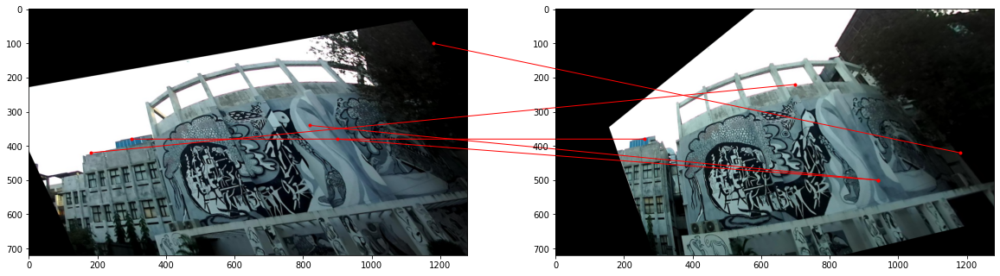

In [52]:
matches, window_size = patch_matching(rimg1, rimg2)
matches.sort(key = lambda x: (x[2]), reverse = True)
selected_matches = matches[5:10]
draw_matching_pts(rimg1, rimg2, selected_matches, window_size)